In [1]:
# importovanje neophodnih datoteka
import scipy
from scipy import *
from pylab import *

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual

import skimage
from skimage import *
from skimage.color import *
from skimage.exposure import *
from skimage.filters import *
from skimage import io
from skimage import morphology

import numpy as np

# Prvi zadatak

## Prvi segment
* Izvrsena je segmenatcija posmatrajuci HUE komponentu slike,
* Korsicen je medijan filter oblika diska da ispegla tackice
* Poredili su se mean i otsu threshold ali se dobija da mnogo bolji vrednosti ima otsu threshold

In [116]:
def coin_mask(img_in):

    # konverzija u hsv oblik, koristimo samo h - HUE nijansa jer se na slici razlikuju uglavnom dve nijanse pogodne za segmenatciju
    img_hsv = skimage.color.rgb2hsv(img_in)
    img_h = img_hsv[:,:,0]

    
    

   
    image_med13x13 = scipy.ndimage.median_filter(img_h, size=(25,25), mode='reflect')
    
    

    thresh_mean = skimage.filters.threshold_mean(image_med13x13.flatten())
    thresh_otsu = skimage.filters.threshold_otsu(image_med13x13.flatten())
    
    """
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 7), dpi=80)
    axes[0].imshow(img_in, cmap='gray'), axes[0].set_title('Ulazna slika'), axes[0].axis('off')
    axes[1].imshow(img_h, cmap='gray'), axes[1].set_title('H komponenta slike'), axes[1].axis('off')
    axes[2].imshow(image_med13x13, cmap='gray'), axes[2].axis('off'), axes[2].set_title('Slika nakon disk median filtra')

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5), dpi=80)
    axes[0].hist(image_med13x13.flatten(), bins=256, color='b'), axes[0].set_title('Histogram slike sa \nodgovarajucim pragovima')
    axes[0].axvline(x=thresh_mean, color='r', linestyle='-')
    axes[0].axvline(x=thresh_otsu, color='g', linestyle='dashdot')
    axes[0].set_facecolor('white')
    axes[1].imshow(image_med13x13<thresh_mean, cmap='gray'), axes[1].set_title('Binarizovana sa mean pragom'), axes[1].axis('off')
    axes[2].imshow(image_med13x13<thresh_otsu, cmap='gray'), axes[2].set_title('Binarizovana sa Otsu pragom'), axes[2].axis('off')
    tight_layout()
    """

    # posto postoje i novcici cija je osvetljenost veca sivi novcici(njihov hue je preko 0.8), vrsi se i njihova detekcija
    thresh_light = 0.8
    image_for_labeling =(image_med13x13<thresh_otsu ).astype(int) + (image_med13x13>thresh_light).astype(int)
    
    """
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), dpi=80)
    axes[0].imshow(img_in, cmap='gray'), axes[0].set_title('Ulazna slika'), axes[0].axis('off')
    axes[1].imshow(image_for_labeling, cmap='gray'), axes[1].set_title('Binarizovana sa Otsu pragom '), axes[1].axis('off')
    tight_layout()
    """
    
    return image_for_labeling








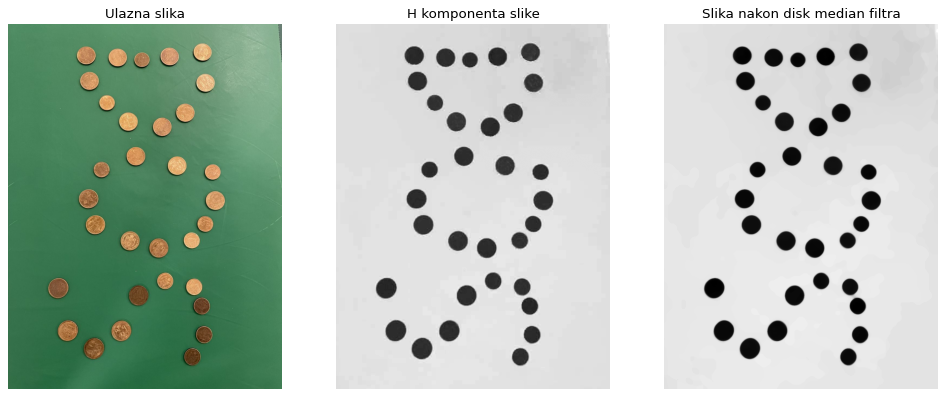

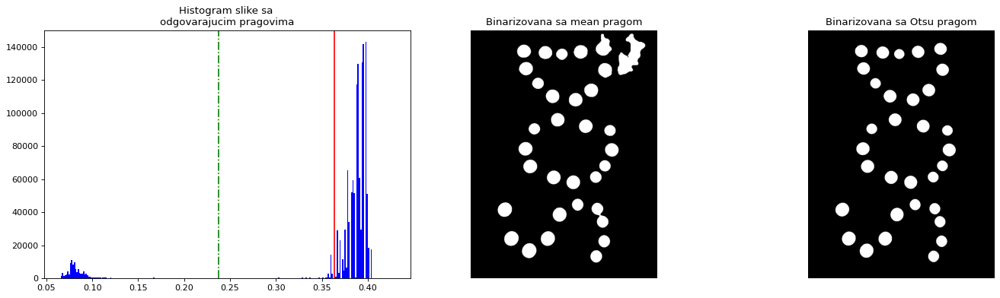

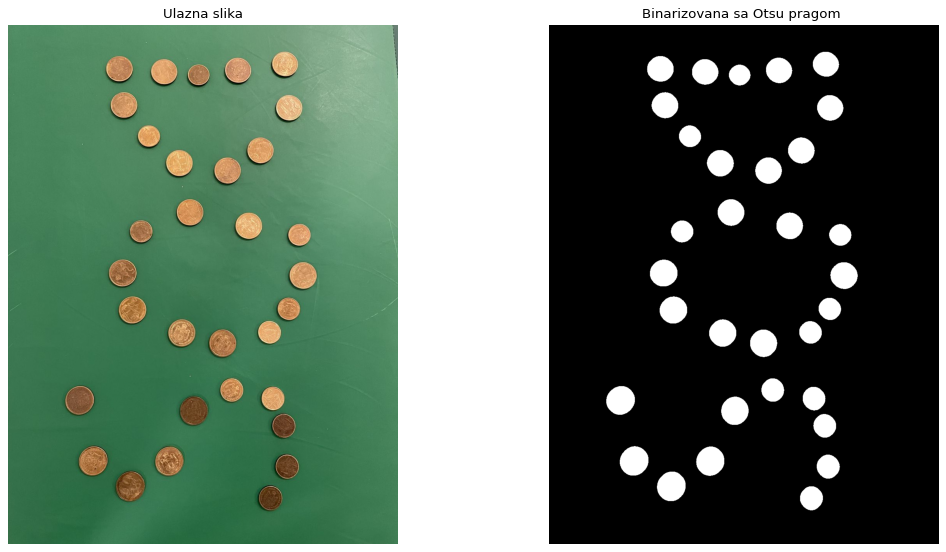

In [110]:
image =  skimage.img_as_float(imread("../sekvence/coins\coins6.jpg"))
cm = coin_mask(image)


# Drugi segment
* funkcija bw_label koja pravi listu povezanih regiona
* koriscena je hash tabela
* dva prolaska
* prvi da prodjemo kroz sve segmentisane delove i odredimo listu ekvivalencija
* drugi da preimenujemo sve u jednu klasu

In [115]:
from collections import defaultdict

def bw_label(img_bin):


    # velicina slike, pad-ovanje
    height, width = img_bin.shape
    img_pad = np.pad(img_bin, pad_width=1, mode='constant')
    label = 1

    # za cuvanje ekvivalentnih labela se korsiti hash mapa
    hash_map = defaultdict(list)
    
    # prvi prolazak kroz sliku
    for r in range(1, height + 1):
        for c in range(1, width + 1):
            
            if img_pad[r, c] == 1:
                
                nearest = [img_pad[r, c - 1], img_pad[r - 1, c - 1],
                              img_pad[r - 1, c], img_pad[r- 1, c + 1]]
                
                non_zero= np.nonzero(nearest)[0]
                
                # ako nema susednih onda trenutni piksel dobija novu labelu
                if len(non_zero) == 0:
                    img_pad[r, c] = label  
                    label += 1  
                

                # ako ima jednog suseda onda trenutni piksel dobija istu labelu
                elif len(non_zero) == 1:  
                    img_pad[r, c] = nearest[non_zero[0]]  

                # ako ima vise suseda dobija vrednost najmanje lable, ali mora se zapamtiti i ekvivalentnost izmedju labela
                else:
                    
                    min_label = min(np.array(nearest)[non_zero])
                    img_pad[r, c] = min_label
                    

                  
                    for i in non_zero: 
                        temp_label = nearest[i]  

                        min_l = str(min_label)  


                        if min_label != temp_label: 
                            # ako postoji onda dodajemo u listu ekivalentnih(koristimo set da bi izbegli ponavljanja) 
                            if min_l in hash_map: 
                                hash_map[min_l] = list(set(hash_map[min_l] + [temp_label]))
                            # ako ne postoji pravimo novi kljuc i vrednost    
                            else:
                                hash_map[min_l] = [temp_label]

    # sad idemo kroz hash-mapu i spajamo jednake labele
    for key in list(hash_map.keys()):
        
        list_key = hash_map[key]

        i = 0
        length_list = len(list_key)

        while i < length_list:
            temp = list_key[i]

            if str(temp) in hash_map:
                # ako je vrenost zapravo neki kljuc u hashmapi spajamo te dve liste i brisemo tu trenutnu
                list_2 = hash_map[str(temp)]
                list_key.extend(list_2)
                hash_map[key] = list_key
                hash_map.pop(str(temp))
                i = 0
                length_list = len(list_key)
                
            else:
                i += 1

    
    img = img_pad[1:height + 1, 1:width + 1]

    # ovde pravimo inverznu hash mapu
    inverse_hash = {}
    for k, v in hash_map.items():
        for val in v:
            inverse_hash[str(val)] = int(k)

    # sad se krecemo kroz celu sliku i svaku labelu menjamo u njenu ekvivalentnu
    for row in range(height):
        for col in range(width):
            p = img[row, col]
            if str(p) in inverse_hash:
                img[row, col] = inverse_hash[str(p)]  


    count = len(np.unique(img)) - 1

    return  img, count                  


[1 1 1 ... 1 1 1]


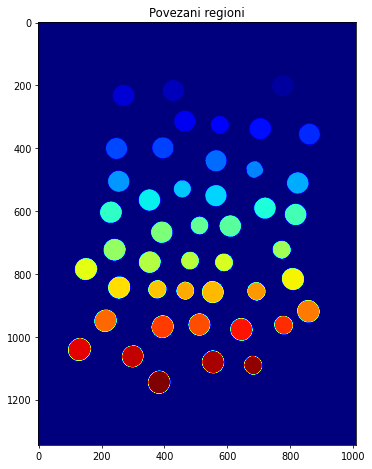

In [93]:
bw_img, cnt = bw_label(cm)

fig, ax = subplots(nrows=1, ncols=1, figsize=(10, 8), dpi=70)
ax.imshow(bw_img, cmap = 'jet')
ax.set_title('Povezani regioni')
plt.show()

# Treci segment

* Klasifikacija se vrsi tako sto se posmatra broj piksela po odredjenom novcicu 
* Odredjuje se threshold i na osnovu njega klasifikacija
* Vidi se da je potpuno tacno odredjena klasifikacija


In [121]:


def coin_classification(img):


    img_bin = coin_mask(img)
    img_label,cnt = bw_label(img_bin)


   
    # odredjujemo koliko unique vrednosti ima (koliko novcica) i koliki je count (koliko piksela po svakom novcicu)
    unique, counts = np.unique(img_label, return_counts=True)
    unique = unique[1:]
    counts = counts[1:]


    #thresh_otsu = skimage.filters.threshold_mean(counts)
    thresh = (np.max(counts) + np.min(counts))/2 
    # odredjujemo threshold tako da razdvoji dve klase
    
    """
    fig, ax = subplots(nrows=1, ncols=1, figsize=(10, 8), dpi=70)
    ax.hist(counts, bins = len(unique))
    ax.set_title('Broj piksela po regionu')
    ax.axvline(x=thresh, color='r', linestyle='-')
    plt.show()
    """
    
    classified = np.where(counts< thresh, 1, 2)
    
    
    uniq_class, counts_class = np.unique(classified, return_counts=True)
    


    #funkcija za svaki novcic druga boja
    image_label_overlay = skimage.color.label2rgb(img_label, image=img, bg_label=0)
    fig, ax = subplots(nrows=1, ncols=1, figsize=(10, 8), dpi=70)
    ax.imshow(image_label_overlay, cmap='jet'), ax.set_title('labelirana slika'), ax.axis('off')

    # odredjivanje centroida da bi se odredila pozicija gde napisati broj klase
    for i  in range(len(unique)):
        region_mask = (img_label == unique[i])
        centroid = np.array(np.mean(np.nonzero(region_mask), axis=1))
        ax.annotate(text=str(classified[i]), xy=(centroid[1], centroid[0]), xytext=(centroid[1], centroid[0]),
                    horizontalalignment='center', verticalalignment='center', fontsize=10)

    plt.show()



    return counts_class, fig










[1 1 1 ... 1 1 1]


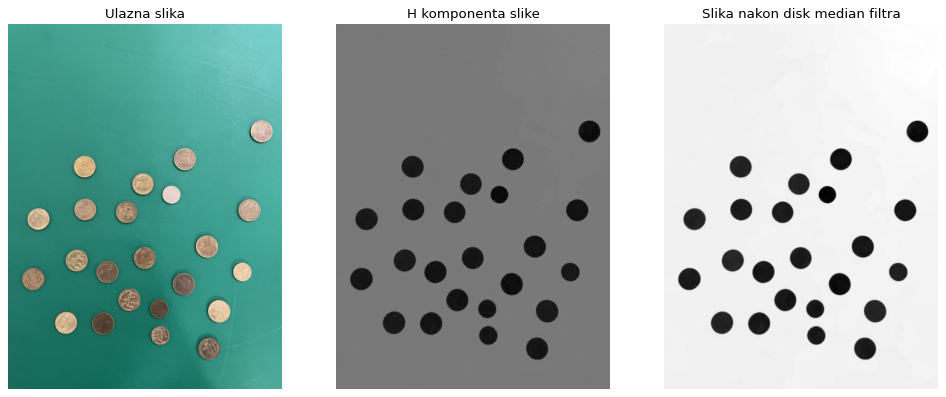

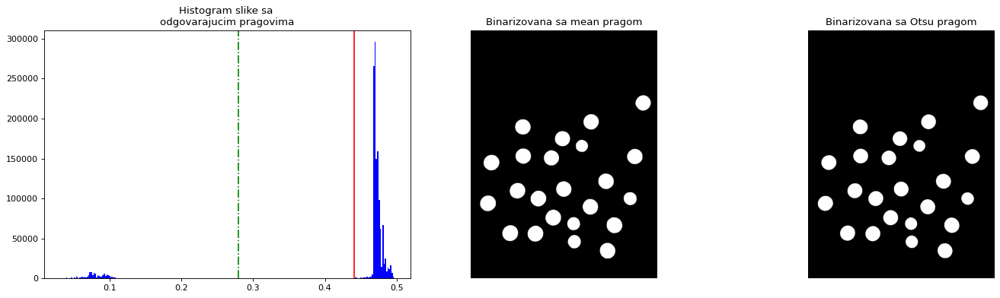

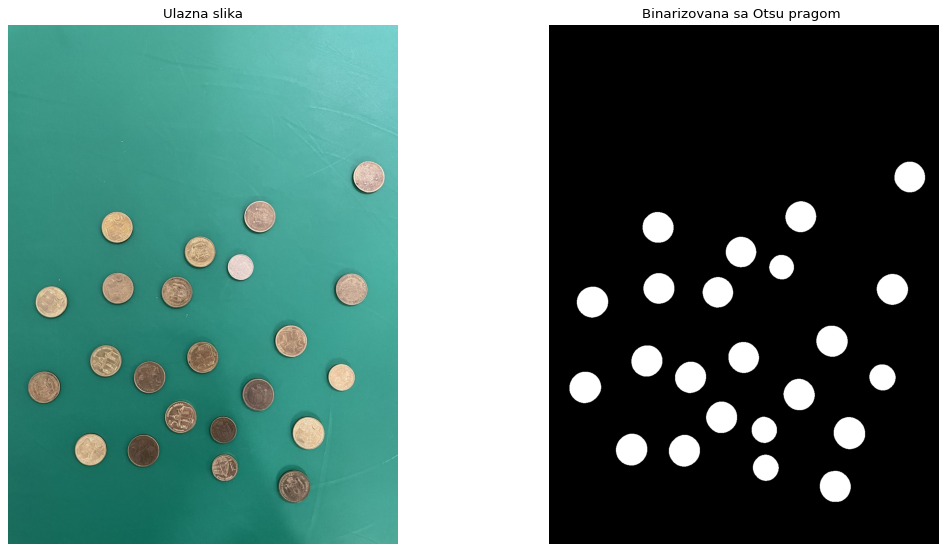

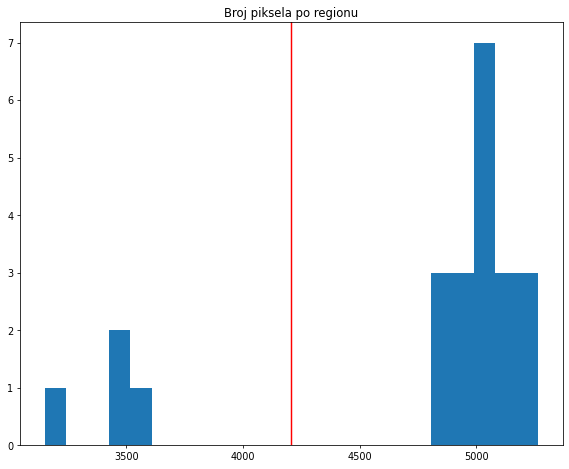

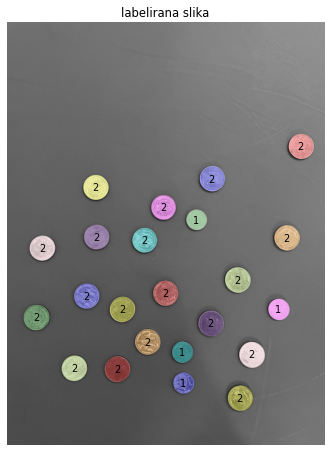

array([ 4, 19], dtype=int64)

In [100]:

coin_classification(image)




# Drugi primer - opet tacno odradjena klasifikacija

[1 1 1 ... 1 1 1]


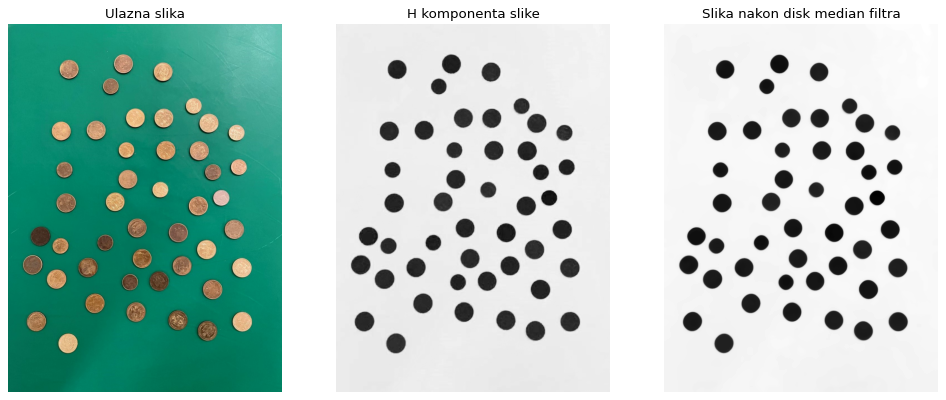

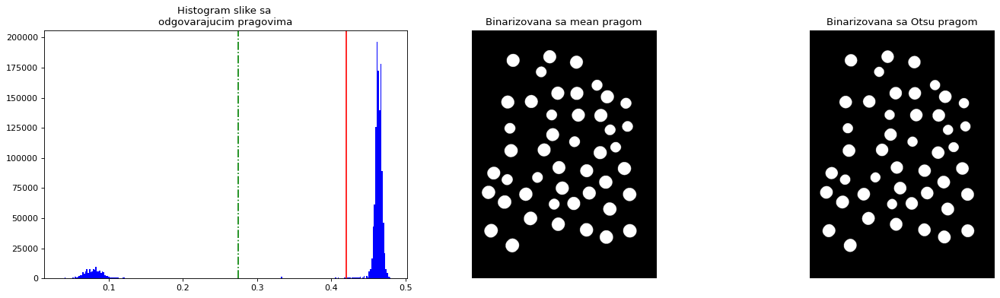

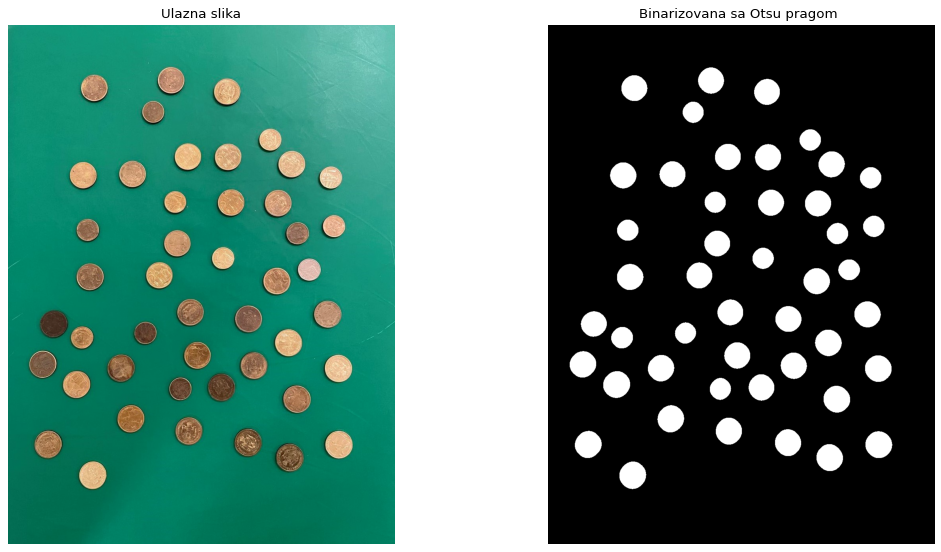

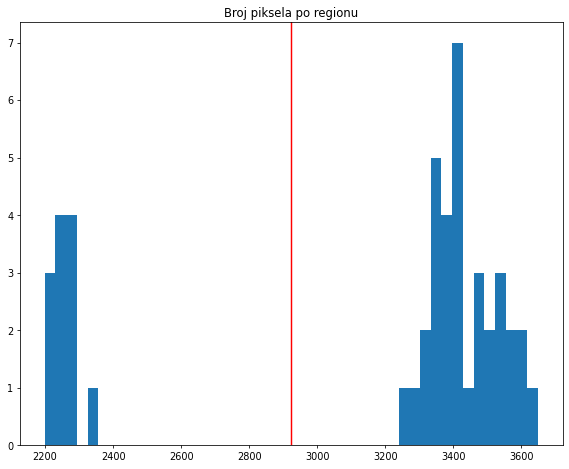

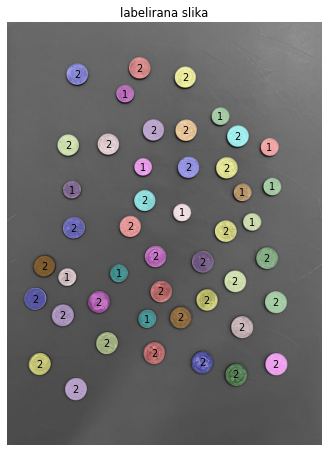

array([12, 34], dtype=int64)

In [112]:
image =  skimage.img_as_float(imread("../sekvence/coins\coins8.jpg"))
coin_classification(image)

C:\Users\Milica\AppData\Local\Temp\ipykernel_34960\324436379.py:46: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


+--------+---------+---------+--------+----------------------+----------------------+-------------------+--------+
| Slika  | Klasa 1 | Klasa 2 | ukupno | Klasa 1 - estimirano | Klasa 2 - estimirano | ukupno-estimirano | greska |
+--------+---------+---------+--------+----------------------+----------------------+-------------------+--------+
| coins1 |    12   |    34   |   46   |          12          |          34          |         46        |  0.0   |
| coins2 |    4    |    19   |   23   |          4           |          19          |         23        |  0.0   |
| coins3 |    10   |    7    |   17   |          10          |          7           |         17        |  0.0   |
| coins4 |    7    |    4    |   11   |          7           |          4           |         11        |  0.0   |
| coins5 |    12   |    22   |   34   |          12          |          22          |         34        |  0.0   |
| coins6 |    11   |    21   |   32   |          11          |          21      

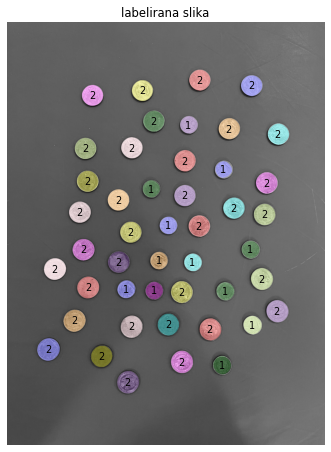

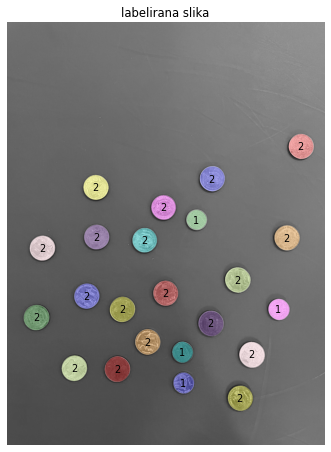

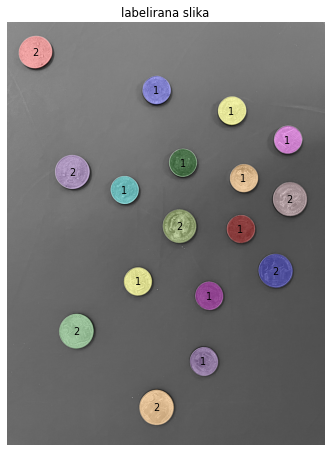

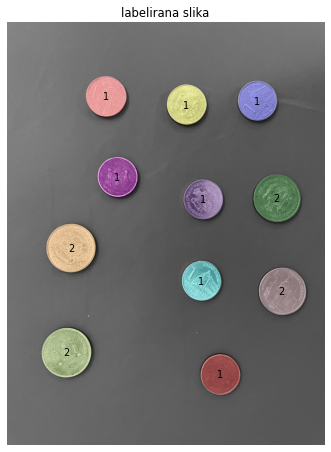

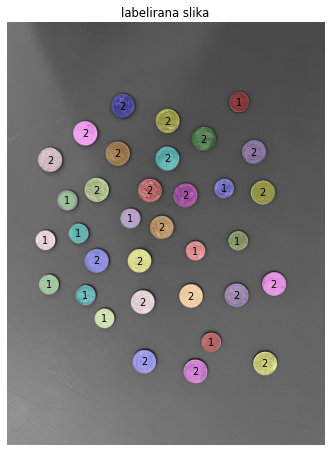

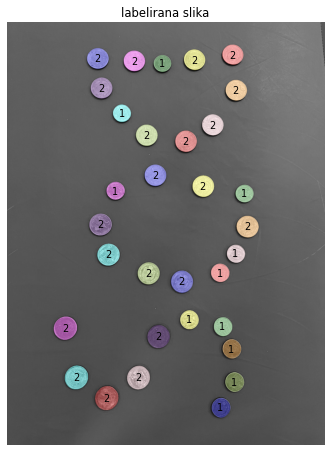

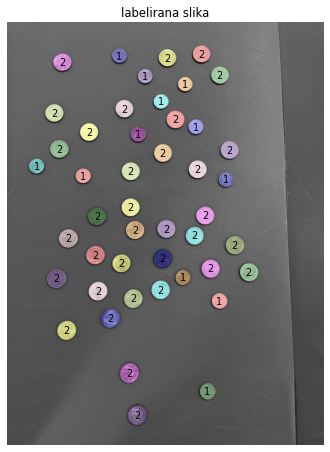

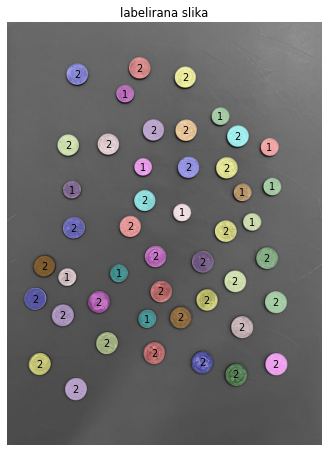

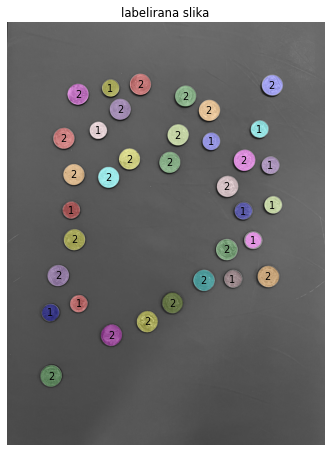

In [123]:
from prettytable import PrettyTable




count_class = np.zeros((9,2))
for i in range(9):
    image =  skimage.img_as_float(imread("../sekvence/coins\coins"+str(i+1)+".jpg"))
    count_class[i],plt = coin_classification(image)
    plt.savefig("coins"+str(i+1)+"out.png")
    

count_class= count_class.astype(int)

table = PrettyTable()
table.field_names = ["Slika", "Klasa 1", "Klasa 2", "ukupno","Klasa 1 - estimirano","Klasa 2 - estimirano", "ukupno-estimirano", "greska"]

table.add_row(["coins1",12,34,46, count_class[0,0], count_class[0,1], count_class[0,0]+count_class[0,1], 1 - (count_class[0,0]+count_class[0,1])/46])
table.add_row(["coins2",4,19,23, count_class[1,0], count_class[1,1], count_class[1,0]+count_class[1,1],1 - (count_class[1,0]+count_class[1,1])/23])
table.add_row(["coins3",10,7,17, count_class[2,0], count_class[2,1], count_class[2,0]+count_class[2,1],1 - (count_class[2,0]+count_class[2,1])/17])
table.add_row(["coins4",7,4,11, count_class[3,0], count_class[3,1], count_class[3,0]+count_class[3,1],1 - (count_class[3,0]+count_class[3,1])/11])
table.add_row(["coins5",12,22,34, count_class[4,0], count_class[4,1], count_class[4,0]+count_class[4,1],1 - (count_class[4,0]+count_class[4,1])/34])
table.add_row(["coins6",11,21,32, count_class[5,0], count_class[5,1], count_class[5,0]+count_class[5,1],1 - (count_class[5,0]+count_class[5,1])/32])
table.add_row(["coins7",12,34,46,count_class[6,0], count_class[6,1], count_class[6,0]+count_class[6,1],1 - (count_class[6,0]+count_class[6,1])/46])
table.add_row(["coins8",12,34,46 ,count_class[7,0], count_class[7,1], count_class[7,0]+count_class[7,1],1 - (count_class[7,0]+count_class[7,1])/46])
table.add_row(["coins9",12,23,35, count_class[8,0], count_class[8,1], count_class[8,0]+count_class[8,1],1 - (count_class[8,0]+count_class[8,1])/35])


print(table)


# Drugi zadatak

* Canny Edge Detection

In [66]:
def canny_edge_detection(image, sigma, low_threshold, high_threshold):

    # 1.KORAK - filtriranje slike Gausovom funkcijom   
    # odredjivanje truncate vrednosti koja se prosledjuje gaussian funkciji  

    size_of_kernel = ceil(6*sigma)
    if(size_of_kernel%2 == 0):
        size_of_kernel += 1
    r = int(floor(size_of_kernel/2))   

    trun = r/sigma 

    img_gauss = skimage.filters.gaussian(image, sigma, mode='nearest', truncate=trun)

    fig, ax = subplots(nrows=1, ncols=2, figsize=(10, 8), dpi=80)
    ax[0].imshow(image, cmap='gray'), ax[0].set_title('Ulazna slika'), ax[0].axis('off')
    ax[1].imshow(img_gauss, cmap='gray'), ax[1].set_title('Gausov filtar'), ax[1].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()
    #-------------------------------------------------------------------------------------

    # 2.KORAK - odredjivanje horizontalnih i vertikalnih gradijenata  

    # Sobelov operator    
    Hx = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    Hy = np.transpose(Hx)

    Gx = scipy.ndimage.correlate(img_gauss, Hx, mode='nearest')
    Gy = scipy.ndimage.correlate(img_gauss, Hy, mode='nearest')

    figure, ax=subplots(nrows=1, ncols=2,figsize=(10, 8), dpi=80)
    ax[0].imshow(Gx, cmap='gray', vmin=amin(Gx), vmax=amax(Gx)), ax[0].set_title('Horizontalne ivice - vertikalni gradijent'), ax[0].axis('off')
    ax[1].imshow(Gy, cmap='gray', vmin=amin(Gy), vmax=amax(Gy)), ax[1].set_title('Vertikalne ivice - horizontalni gradijent'), ax[1].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()

    #--------------------------------------------------------------------------------------


    # 3.KORAK - odredjivanje magnitude i ugla gradijenta    
    mag = np.sqrt(np.square(Gx) + np.square(Gy))
    angle = np.rad2deg(np.arctan2(Gy, Gx))

    figure, ax=subplots(nrows=1, ncols=2, figsize=(10, 8), dpi=80)


    ax[0].imshow(mag, cmap='gray'), ax[0].set_title('Magnituda gradijenta'), ax[0].axis('off')
    im0 = ax[1].imshow(angle, cmap='jet')
    ax[1].set_title('Ugao gradijenta arctan2')
    ax[1].axis('off')
    figure.colorbar(im0, ax=ax[1], fraction=0.03, pad=0.04)
    matplotlib.pyplot.tight_layout()
    plt.show()

    #-------------------------------------------------------------------------------------
    
    

    # 4. i 5 KORAK- kvantizacija gradijenta na 1 od 4 pravaca i potiskivanje vrednosti koji ne predstavljaju lokalne maksimume

    non_maximum_image = np.zeros_like(mag)
    h,w = image.shape  
    mag = mag/np.max(mag)    

    for i in range(1,h-1):
        for j in range(1,w-1):

            
            # -45 stepeni
            if (-67.5 <= angle[i,j] <-22.5) or (112.5<= angle[i,j] <= 157.5):
                    sused1 = mag[i-1, j+1]
                    sused2 = mag[i+1, j-1]

            # 0 stepeni
            if (-22.5 <= angle[i,j] < 22.5) or (-180<= angle[i,j] <= -157.5) or (157.5<= angle[i,j] <= 180):
                    sused1 = mag[i-1, j]
                    sused2 = mag[i+1, j]

            # 45 stepeni
            if (-157.5 <= angle[i,j] < -112.5) or (22.5<= angle[i,j] <= 67.5):
                    sused1 = mag[i-1, j-1]
                    sused2 = mag[i+1, j+1]  

             # 90 stepeni
            if (-112.5 <= angle[i,j] < -67.5) or (67.5<= angle[i,j] <= 112.5):
                    sused1 = mag[i, j-1]
                    sused2 = mag[i, j+1] 

            if (mag[i,j] >= sused1) and (mag[i,j] >= sused2):
                    non_maximum_image[i,j] = mag[i,j]
            else:
                    non_maximum_image[i,j] = 0           

    
    non_maximum_image= non_maximum_image/np.max(non_maximum_image)
    fig, ax = subplots(nrows=1, ncols=1, figsize=(10, 8), dpi=70)
    ax.imshow(non_maximum_image, cmap='gray',vmin=amin(non_maximum_image), vmax=amax(non_maximum_image)), ax.set_title('Potiskivanje lokalnih nemaksimuma'), ax.axis('off')   

    #----------------------------------------------------------------------------------------


    # 6. KORAK - odredjivanje mapa jakih i slabih ivica na osnovu vrednosti nizeg i viseg praga

    edges = np.zeros_like(non_maximum_image)
    strong_edges = (non_maximum_image >= high_threshold)
    weak_edges = (non_maximum_image >= low_threshold) & (non_maximum_image < high_threshold)


    edges[strong_edges] = 255   
    
    edges_weak = np.zeros_like(non_maximum_image)
    edges_weak[weak_edges] = 255   

    figure, ax=subplots(nrows=1, ncols=2, figsize=(10, 8), dpi=80)
    ax[0].imshow(edges, cmap='gray'), ax[0].set_title('Jake ivice'), ax[0].axis('off')
    ax[1].imshow(edges_weak, cmap='gray'), ax[1].set_title('Slabe ivice'), ax[1].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()    


    #-------------------------------------------------------------------------------

    # 7.KORAK ukljucivanje u izlaznu mapu ivica onih slbih ivica koje su povezane sa nekom jakom ivicom

  
    for i in range(1, non_maximum_image.shape[0] - 1):
        for j in range(1, non_maximum_image.shape[1] - 1):
              if weak_edges[i, j]:
                    susedi = edges[i-1:i+2, j-1:j+2]
                    if np.any(susedi == 255):
                        edges[i, j] = 255


    fig, ax = subplots(nrows=1, ncols=1, figsize=(10, 8), dpi=70)
    ax.imshow(edges, cmap='gray'), ax.set_title('Detektovane ivice'), ax.axis('off') 


            










    

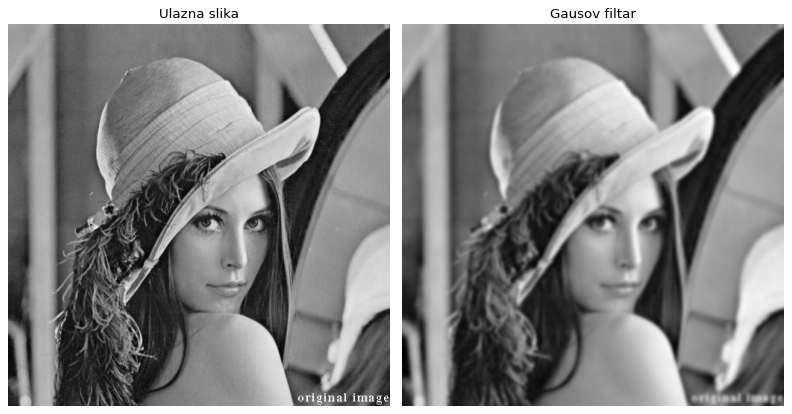

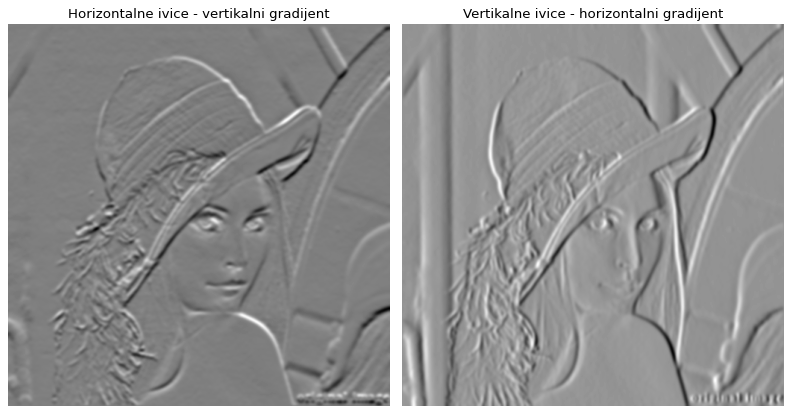

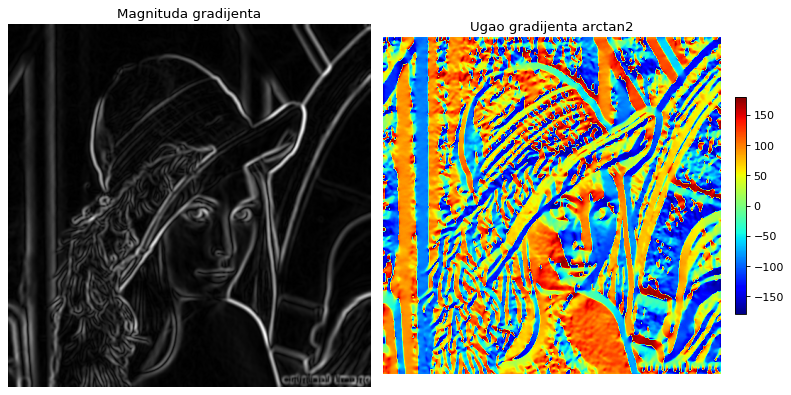

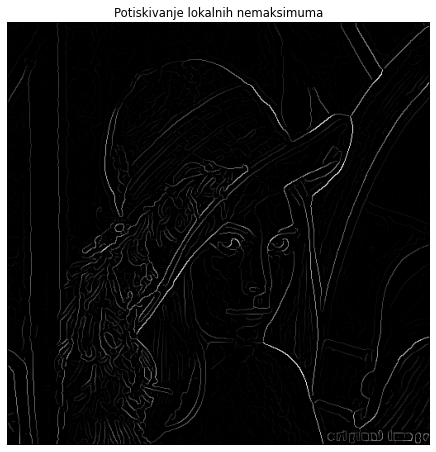

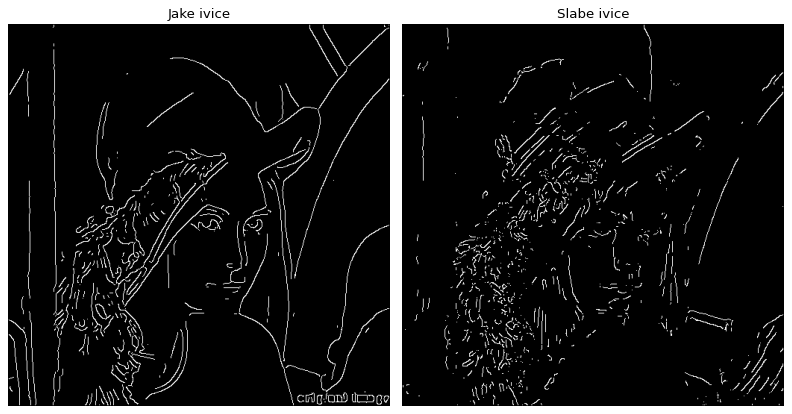

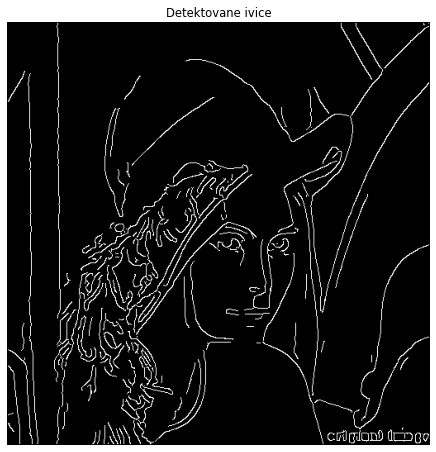

In [67]:
image =  skimage.img_as_float(imread("../sekvence/lena.tif"))

canny_edge_detection(image, 2, 0.08,0.2)

## 1.KORAK - filtriranje slike Gausovom funkcijom   
     * Prvo se odredjuje truncate vrednost koja se prosledjuje funkciji za filtriranje
     * Na prvom grafiku se vidi kako je Gausov filtar blur-ovao sliku sto ce biti kasnije neophodno za detektovanje ivica (smanjuje sum)
## 2.KORAK - odredjivanje horizontalnih i vertikalnih gradijenata      
     * Koristi se Sobelov operator , na sledecem grafiku se vidi da su uspesno detektovani
## 3.KORAK - odredjivanje magnitude i ugla gradijenta    
     * Zatim se odredjuje magnituda i ugao, vidi se da je lepo odredjena magnituda ali za ivice je neophodno da budu jedinicnog odziva
     
## 4. i 5 KORAK- kvantizacija gradijenta na 1 od 4 pravaca i potiskivanje vrednosti koji ne predstavljaju lokalne maksimume
     * Radi se kvantizacija gradijenta na 4 pravca gde se za svaki piksel gleda da li je maksimum u datnjegovomom pravcu gradijenta, ako nije brise se
     * Sa slike se vidi da smo dobili ivice manje debljine ali razlicitog intenziteta
     
## 6. KORAK - odredjivanje mapa jakih i slabih ivica na osnovu vrednosti nizeg i viseg praga   
     * Postavljaju se 2 vrednosti praga, jedan visi iznad koga su sigurno jake ivice i jedan nizi

## 7.KORAK -  ukljucivanje u izlaznu mapu ivica onih slbih ivica koje su povezane sa nekom jakom ivicom 
     * Ako je neka slaba ivica povezana sa jakom (dodiruju se u 8- susedstvu) proglasava se jakom ivicom    
     






# Prvi set parametara - najbolji 

* Odabran je prvi set parametara sigma = 2, dovoljno da se se potisne sum, donji threshold = 0.09 i gornji treshhold = 0.2
* Sve potrebne ivice sa originlane slike su izdvojene, ako se implentira jos jedan prolazak kroz spajanje slabih i jakih ivica doslo bi se do jos bolje rezultata







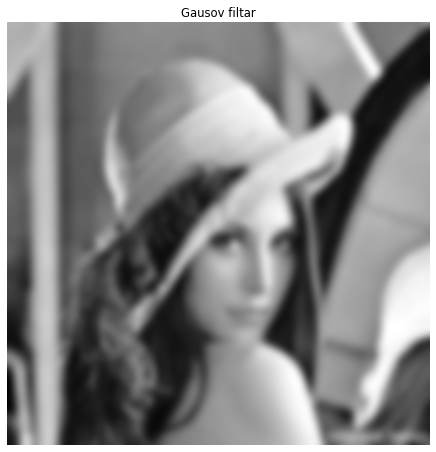

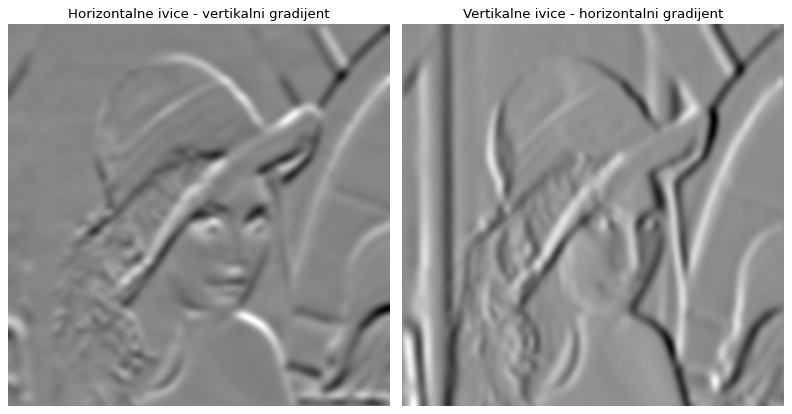

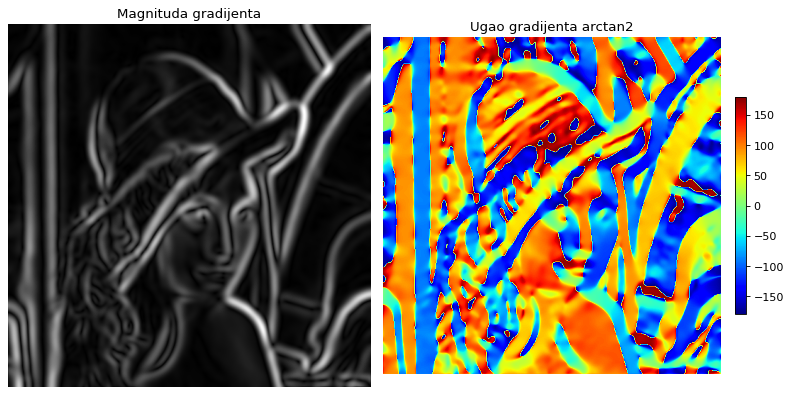

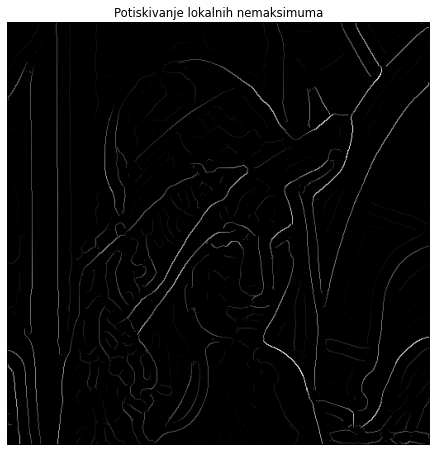

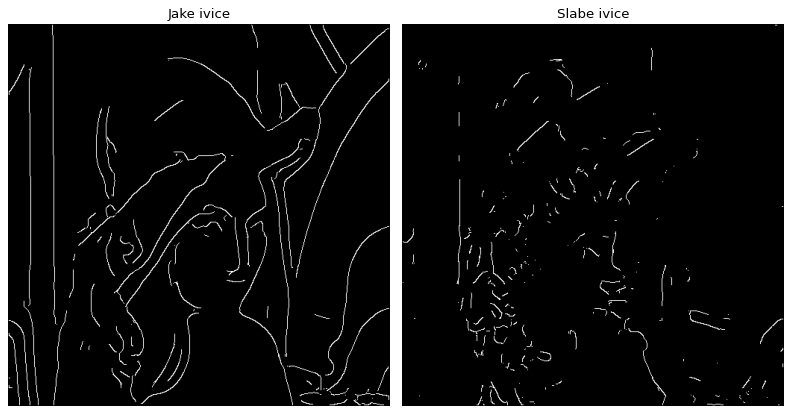

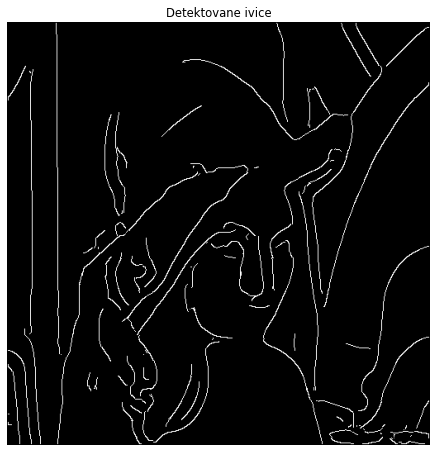

In [14]:
canny_edge_detection(image, 5, 0.09,0.2)

# Drugi set parametara - smanjen sum
* Ovde vidimo da bez NF filtra izdavjaju se nepotrebni detalji kose

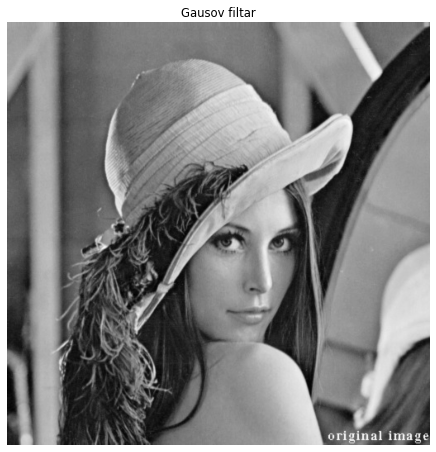

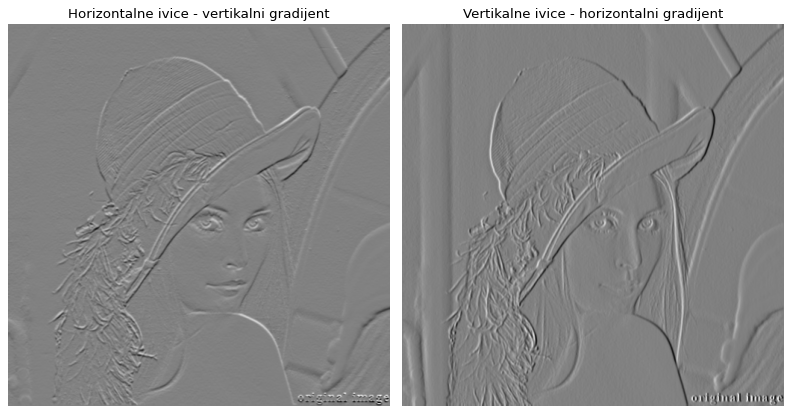

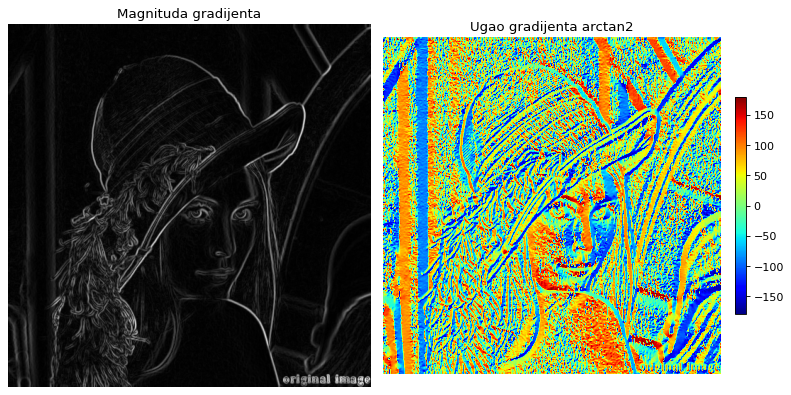

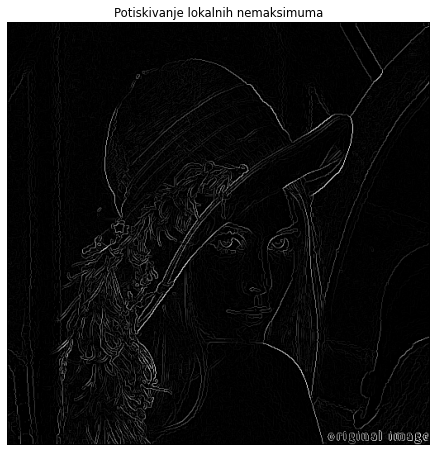

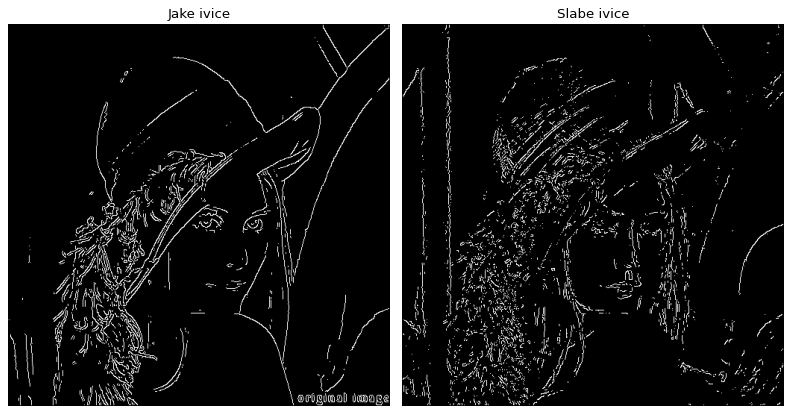

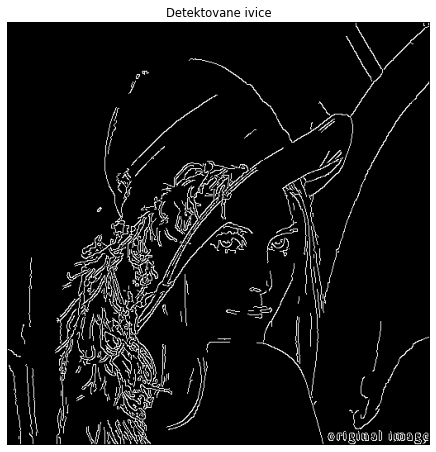

In [15]:
canny_edge_detection(image, 0.5, 0.09,0.2)

# Treci set parametara / znacajno smanjen donji threshold

- sa smanjenjem donjeg tresholda znacajno povecana kolicina slabih ivica

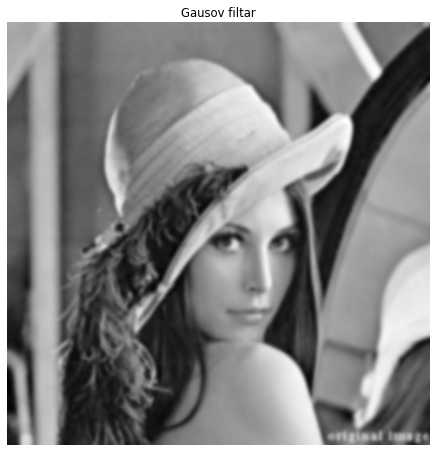

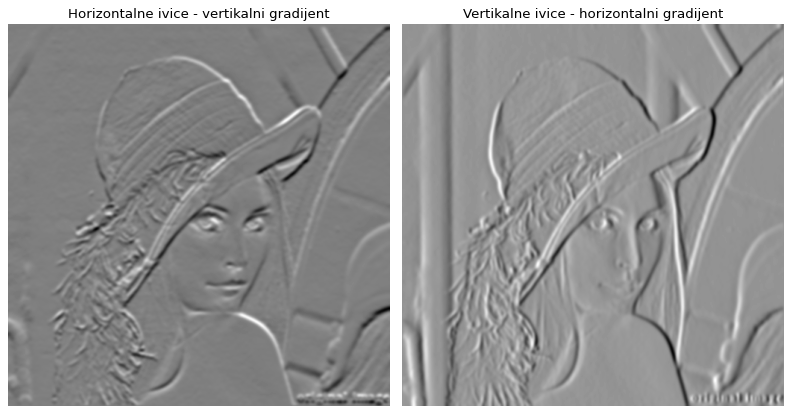

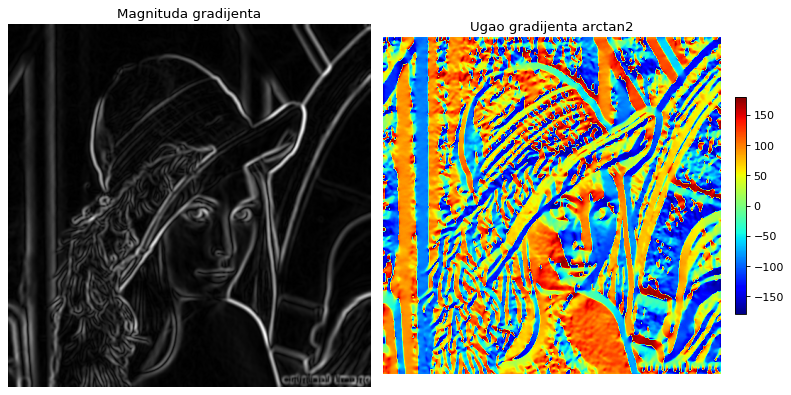

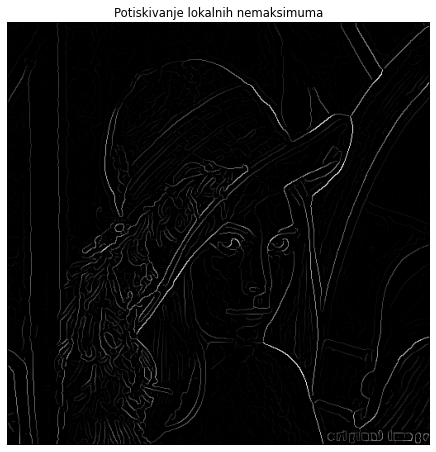

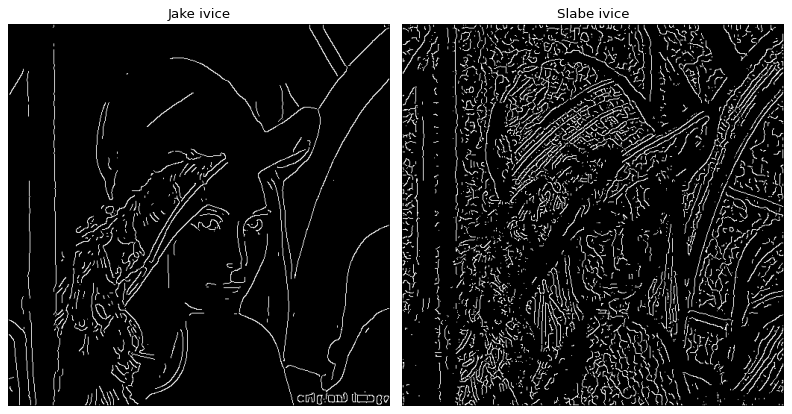

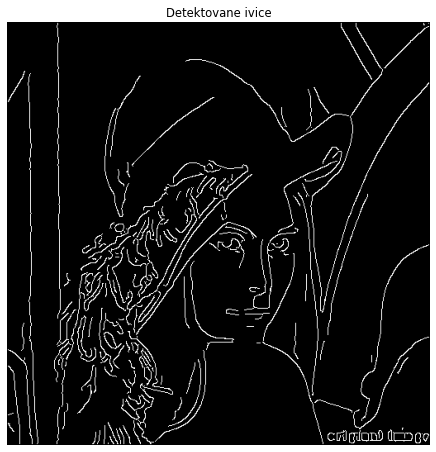

In [16]:
canny_edge_detection(image, 2, 0.01,0.2)

# 4. set parametara - gornji threshold povecan
* Uz povecanje gornjeg thresholda broj jakih ivica znacajno opao, nemoguca rekonstrukcija ivica

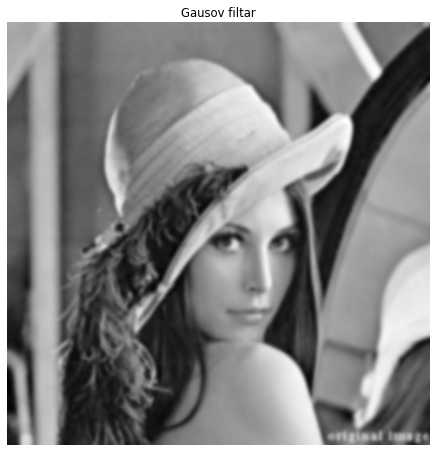

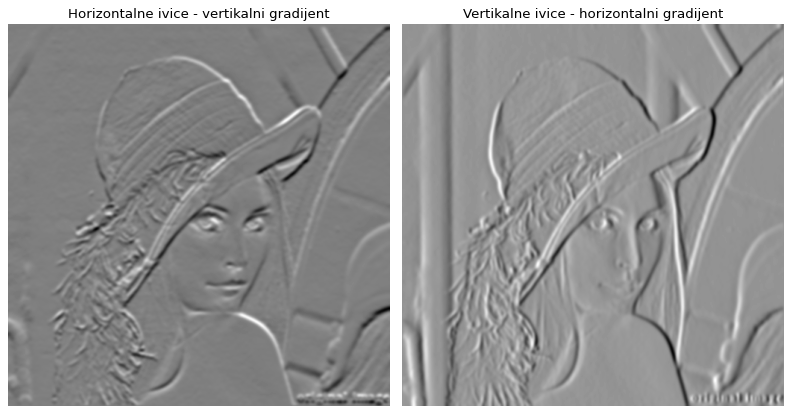

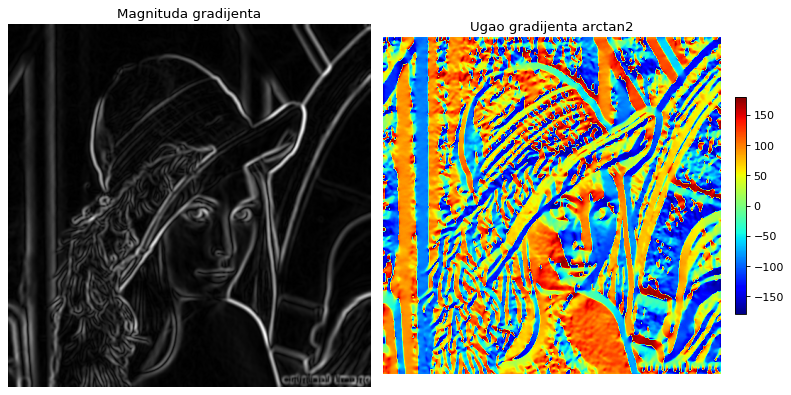

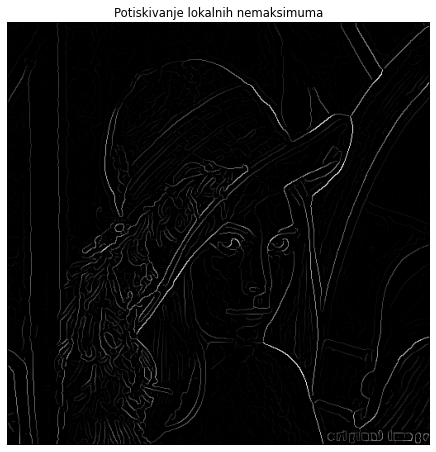

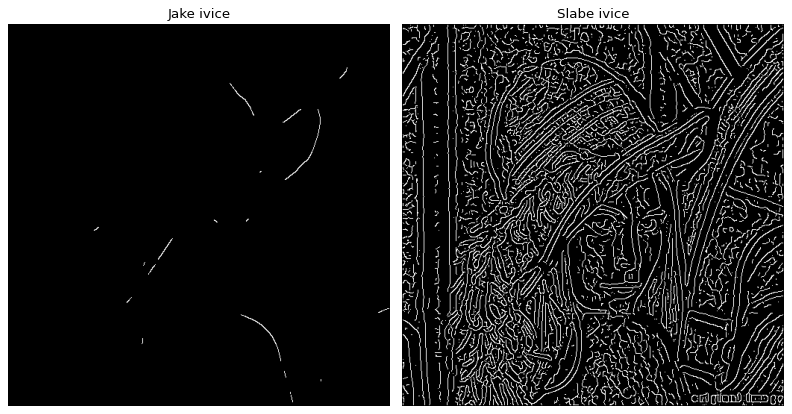

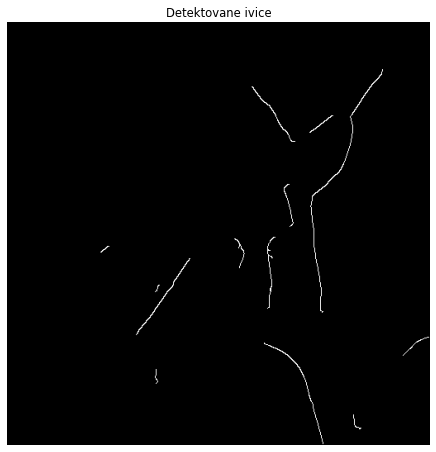

In [17]:
canny_edge_detection(image, 2, 0.01,0.7)

# Camerman.tif 
* Izabrana je vrednost sigma takva da se potisne sum
* Gornji threshold tako da se izdvoje sve znacajnije ivice
* Donji threshold i slabe ivice su dodale jos par detalja


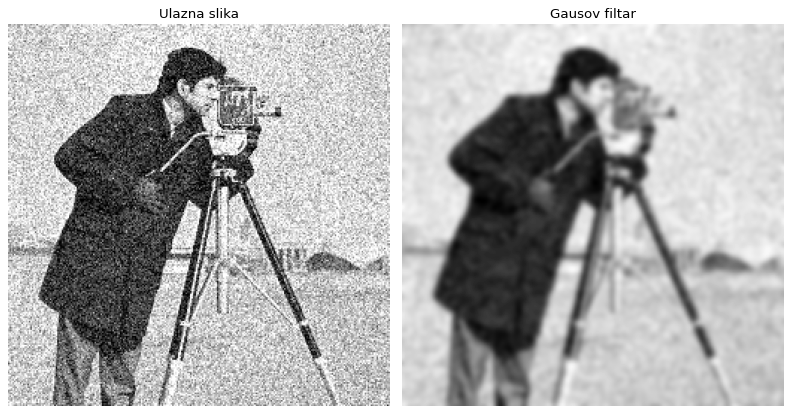

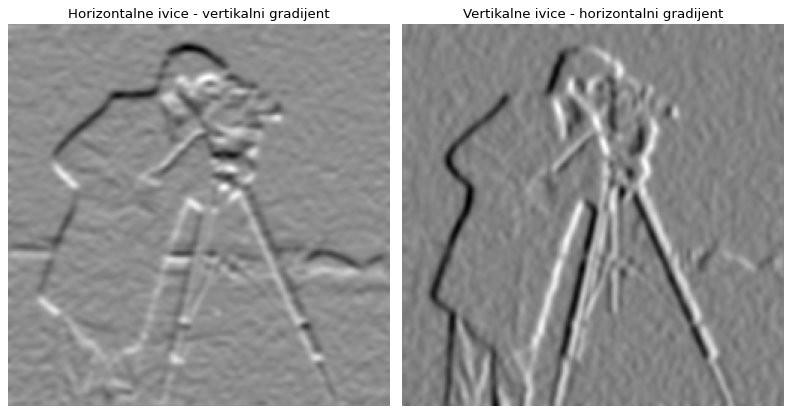

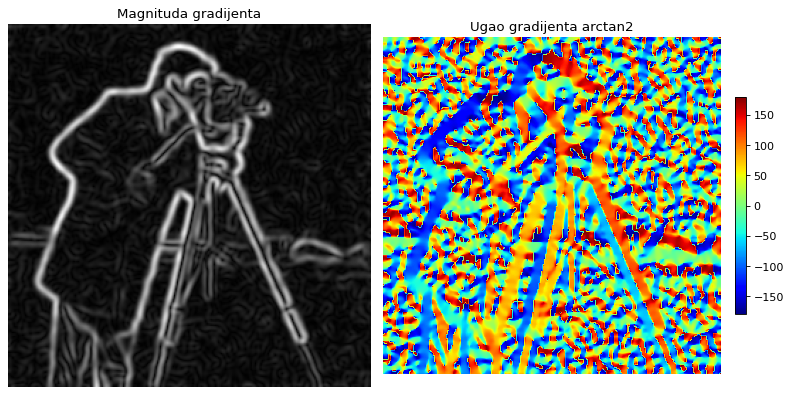

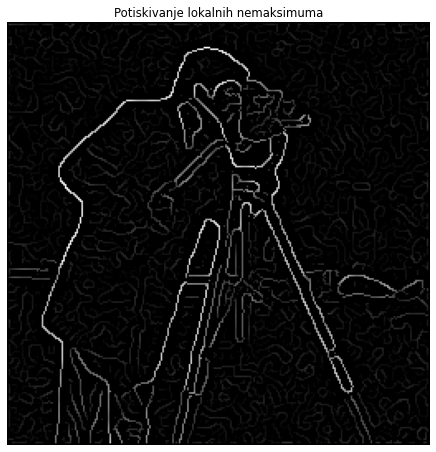

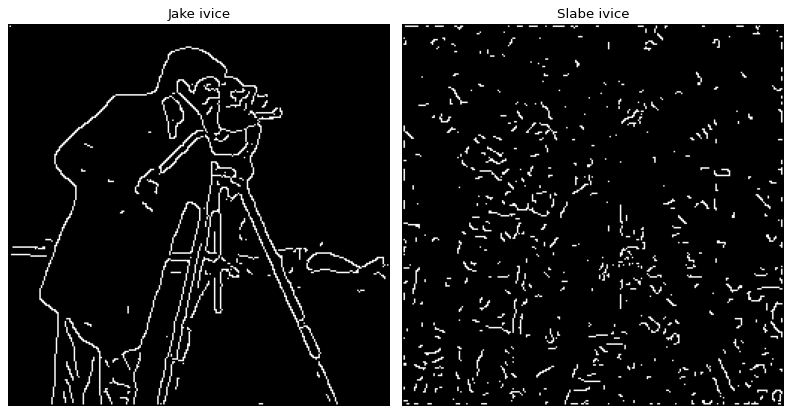

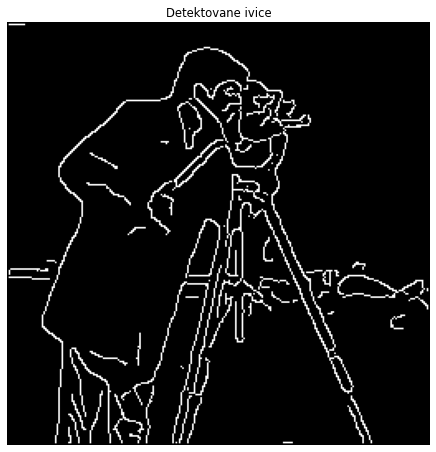

In [68]:
image =  skimage.img_as_float(imread("../sekvence/camerman.tif"))

canny_edge_detection(image, 2, 0.1,0.2)

# Van.tif slika
* vrednost sigma ostaje ista kao i u prethodnim slucajevima
* izabran je gornji threshold tako da ostanu sve znacajne ivice
* biranjem donjeg dodati su detalji(mada ne znacajno)

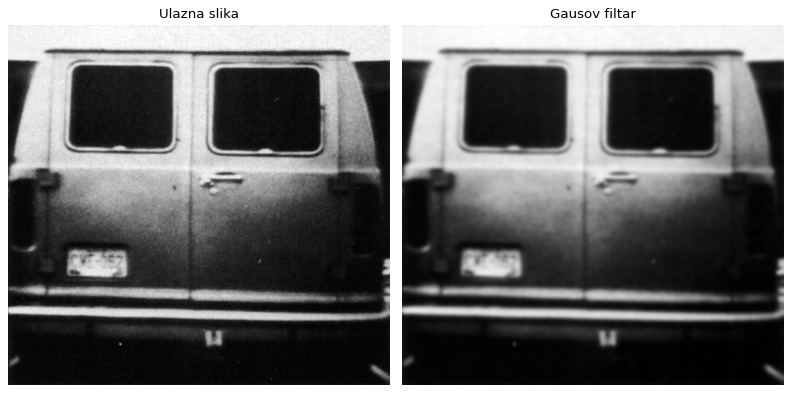

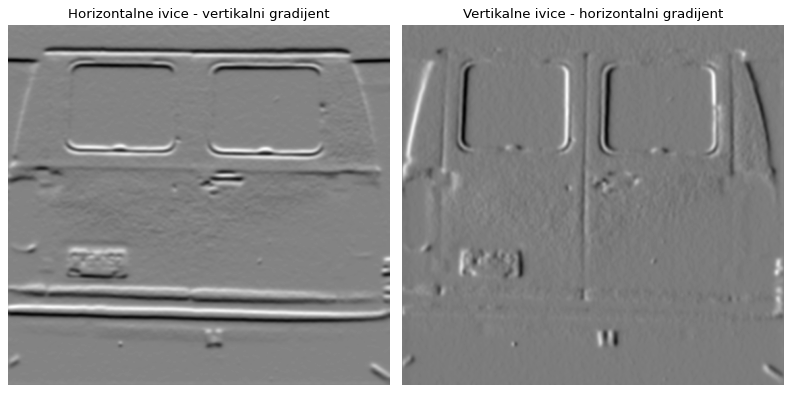

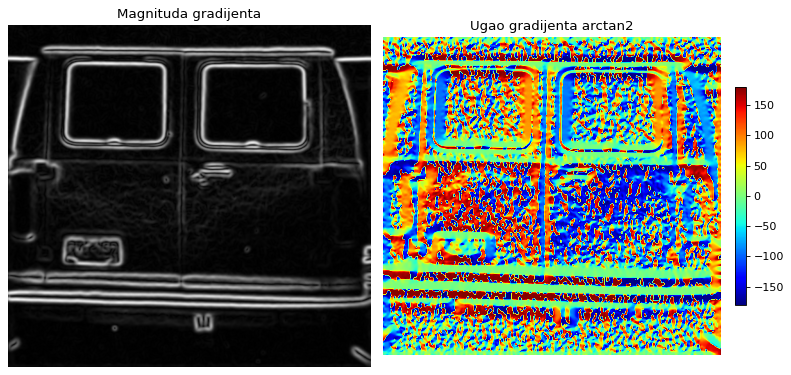

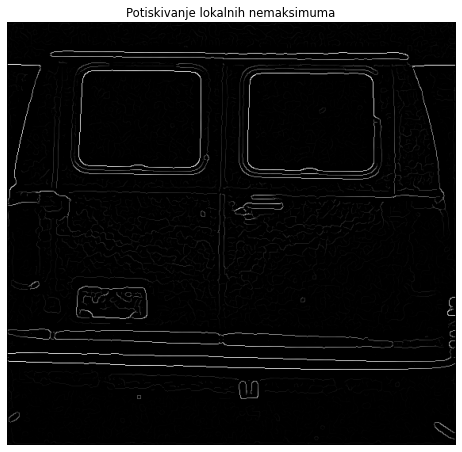

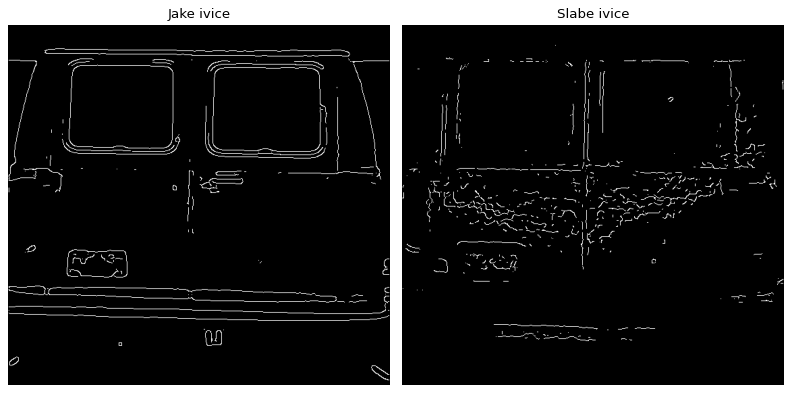

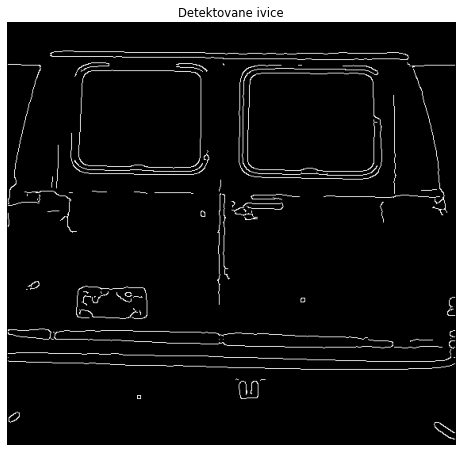

In [73]:
image =  skimage.img_as_float(imread("../sekvence/van.tif"))

canny_edge_detection(image, 2, 0.08,0.2)

# Buildnig.tif 
* U ovom slucaju malo je povecana vrednost sigma da bi nestale ivivce detalji na krovu, mada to je proizvoljno ako zelimo mozemo i njih osyaviti
* Ostala dva thresholda su ista kao u prethodnim slucajevima
* Detekovane su osnovne konture zgrade

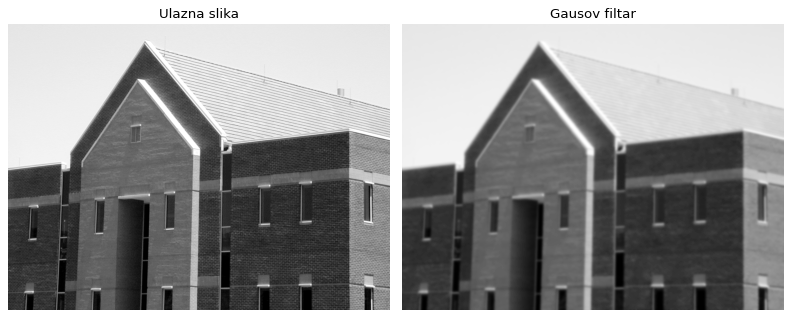

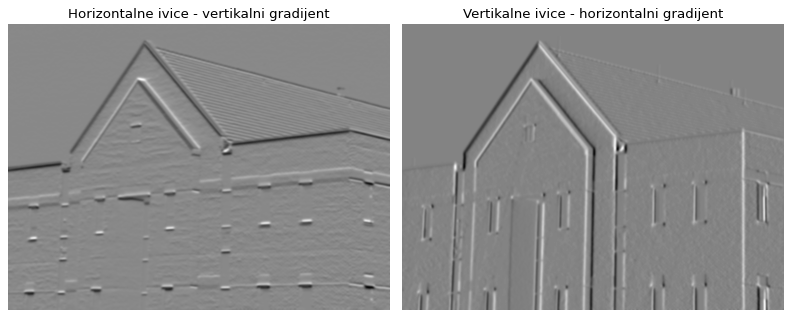

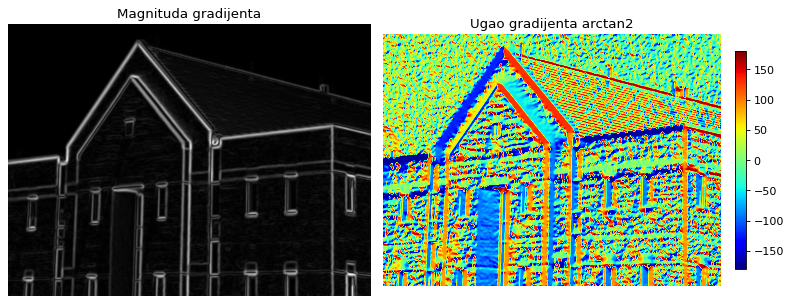

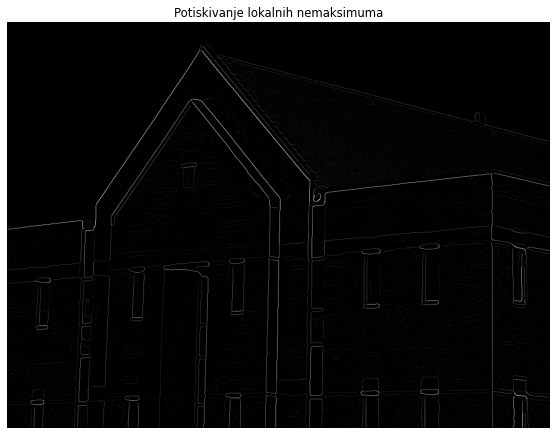

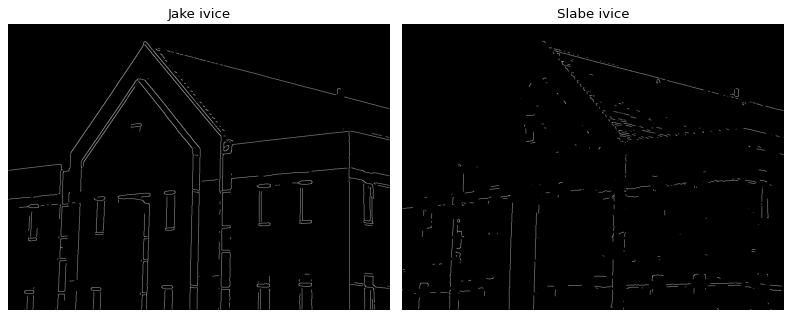

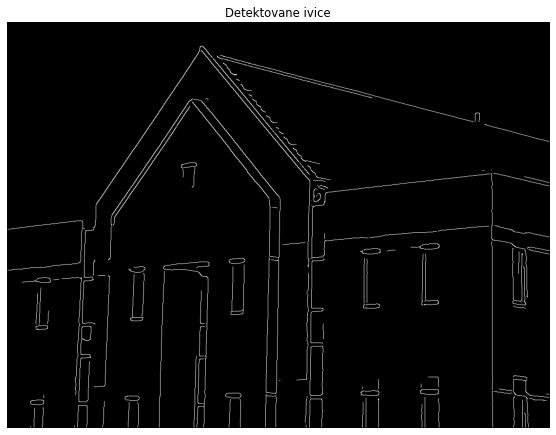

In [70]:
image =  skimage.img_as_float(imread("../sekvence/building.tif"))

canny_edge_detection(image, 3, 0.1,0.2)